# Import libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-__hf_8it
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-__hf_8it
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98531 sha256=57b1cde351d9995d83855dbc3e5d50f0b82eff7403d9905263cef7c5c1b71673
  Stored in directory: /tmp/pip-ephem-wheel-cache-96v85_37/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [3]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

Cloning into 'torch_cv_wrapper'...
remote: Enumerating objects: 256, done.
remote: Counting objects: 100% (256/256), done.
remote: Compressing objects: 100% (246/246), done.
remote: Total 256 (delta 147), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (256/256), 61.10 KiB | 8.73 MiB/s, done.
Resolving deltas: 100% (147/147), done.


In [4]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [5]:
config = helper.process_config("/content/drive/MyDrive/Cifar10_Resnet/session8_assignment/Cifar10_with_resnet18_BN_OneCycleLR.yml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'OneCycleLR',
 'model': 'Resnet18',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'Cifar10_with_resnet18_BN_OneCycleLR',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_pa

## Create Training Instance

In [6]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [7]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


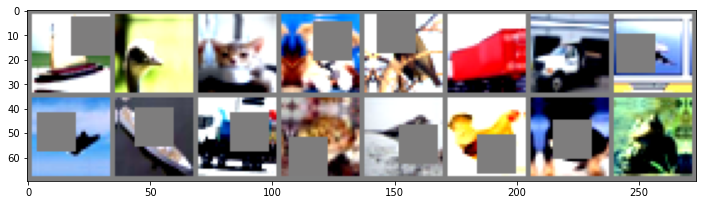

In [8]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [9]:
model = resnet.ResNet18("BN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 32, 32]          73,728
      BatchNorm2d-14          [-1, 128,

## Trigger training

In [10]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")

  0%|          | 0/196 [00:00<?, ?it/s]

using OneCycleLR
Epoch 1:


Loss=1.3998582363128662 Batch_id=195 LR=0.00006 Accuracy=41.47: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0061, Accuracy: 4622/10000 (46.22%)

Epoch 2:


Loss=1.178790807723999 Batch_id=195 LR=0.00010 Accuracy=54.74: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0047, Accuracy: 5803/10000 (58.03%)

Epoch 3:


Loss=1.1429905891418457 Batch_id=195 LR=0.00018 Accuracy=61.09: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0044, Accuracy: 6277/10000 (62.77%)

Epoch 4:


Loss=0.9084812998771667 Batch_id=195 LR=0.00028 Accuracy=66.08: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0077, Accuracy: 4610/10000 (46.10%)

Epoch 5:


Loss=0.9171091318130493 Batch_id=195 LR=0.00040 Accuracy=69.55: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 7330/10000 (73.30%)

Epoch 6:


Loss=0.9354819059371948 Batch_id=195 LR=0.00052 Accuracy=72.53: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 7092/10000 (70.92%)

Epoch 7:


Loss=0.571439266204834 Batch_id=195 LR=0.00064 Accuracy=74.59: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0037, Accuracy: 7102/10000 (71.02%)

Epoch 8:


Loss=0.5392411351203918 Batch_id=195 LR=0.00076 Accuracy=76.65: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7550/10000 (75.50%)

Epoch 9:


Loss=0.8729863166809082 Batch_id=195 LR=0.00086 Accuracy=77.93: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 7228/10000 (72.28%)

Epoch 10:


Loss=0.7629578709602356 Batch_id=195 LR=0.00094 Accuracy=79.31: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 7538/10000 (75.38%)

Epoch 11:


Loss=0.6238148808479309 Batch_id=195 LR=0.00098 Accuracy=80.56: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0024, Accuracy: 8088/10000 (80.88%)

Epoch 12:


Loss=0.6209496855735779 Batch_id=195 LR=0.00100 Accuracy=81.69: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 7995/10000 (79.95%)

Epoch 13:


Loss=0.6280261874198914 Batch_id=195 LR=0.00100 Accuracy=82.66: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8121/10000 (81.21%)

Epoch 14:


Loss=0.4427272379398346 Batch_id=195 LR=0.00099 Accuracy=83.55: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8237/10000 (82.37%)

Epoch 15:


Loss=0.3603052496910095 Batch_id=195 LR=0.00097 Accuracy=84.50: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 8025/10000 (80.25%)

Epoch 16:


Loss=0.5988141298294067 Batch_id=195 LR=0.00095 Accuracy=85.05: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8319/10000 (83.19%)

Epoch 17:


Loss=0.3557250201702118 Batch_id=195 LR=0.00092 Accuracy=85.94: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0028, Accuracy: 7944/10000 (79.44%)

Epoch 18:


Loss=0.3384777009487152 Batch_id=195 LR=0.00089 Accuracy=86.44: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0034, Accuracy: 7553/10000 (75.53%)

Epoch 19:


Loss=0.28161317110061646 Batch_id=195 LR=0.00085 Accuracy=87.13: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 8618/10000 (86.18%)

Epoch 20:


Loss=0.3030535578727722 Batch_id=195 LR=0.00081 Accuracy=87.59: 100%|██████████| 196/196 [00:56<00:00,  3.48it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8744/10000 (87.44%)

Epoch 21:


Loss=0.5103918313980103 Batch_id=195 LR=0.00077 Accuracy=88.39: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8731/10000 (87.31%)

Epoch 22:


Loss=0.2892107665538788 Batch_id=195 LR=0.00072 Accuracy=88.91: 100%|██████████| 196/196 [00:56<00:00,  3.48it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8803/10000 (88.03%)

Epoch 23:


Loss=0.31685614585876465 Batch_id=195 LR=0.00066 Accuracy=89.30: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0017, Accuracy: 8660/10000 (86.60%)

Epoch 24:


Loss=0.3185792863368988 Batch_id=195 LR=0.00061 Accuracy=89.94: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0016, Accuracy: 8752/10000 (87.52%)

Epoch 25:


Loss=0.264386385679245 Batch_id=195 LR=0.00056 Accuracy=90.47: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0015, Accuracy: 8838/10000 (88.38%)

Epoch 26:


Loss=0.1971689760684967 Batch_id=195 LR=0.00050 Accuracy=91.15: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 8331/10000 (83.31%)

Epoch 27:


Loss=0.1829754263162613 Batch_id=195 LR=0.00044 Accuracy=91.96: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0014, Accuracy: 8925/10000 (89.25%)

Epoch 28:


Loss=0.2806253135204315 Batch_id=195 LR=0.00039 Accuracy=92.62: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0013, Accuracy: 8980/10000 (89.80%)

Epoch 29:


Loss=0.22041818499565125 Batch_id=195 LR=0.00033 Accuracy=93.10: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9093/10000 (90.93%)

Epoch 30:


Loss=0.13434568047523499 Batch_id=195 LR=0.00028 Accuracy=93.91: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9176/10000 (91.76%)

Epoch 31:


Loss=0.11995901167392731 Batch_id=195 LR=0.00023 Accuracy=94.57: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9197/10000 (91.97%)

Epoch 32:


Loss=0.24163560569286346 Batch_id=195 LR=0.00019 Accuracy=95.11: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9216/10000 (92.16%)

Epoch 33:


Loss=0.11022776365280151 Batch_id=195 LR=0.00015 Accuracy=95.50: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9295/10000 (92.95%)

Epoch 34:


Loss=0.06946079432964325 Batch_id=195 LR=0.00011 Accuracy=96.15: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9302/10000 (93.02%)

Epoch 35:


Loss=0.10372600704431534 Batch_id=195 LR=0.00008 Accuracy=96.51: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9331/10000 (93.31%)

Epoch 36:


Loss=0.05865665152668953 Batch_id=195 LR=0.00005 Accuracy=96.79: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9361/10000 (93.61%)

Epoch 37:


Loss=0.1009964570403099 Batch_id=195 LR=0.00003 Accuracy=97.23: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 9363/10000 (93.63%)

Epoch 38:


Loss=0.07039232552051544 Batch_id=195 LR=0.00001 Accuracy=97.25: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 9381/10000 (93.81%)

Epoch 39:


Loss=0.07181387394666672 Batch_id=195 LR=0.00000 Accuracy=97.30: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 9385/10000 (93.85%)

Epoch 40:


Loss=0.06792539358139038 Batch_id=195 LR=0.00000 Accuracy=97.51: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]



Test set: Average loss: 0.0008, Accuracy: 9379/10000 (93.79%)



## Missclassification

Total wrong predictions are 621
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


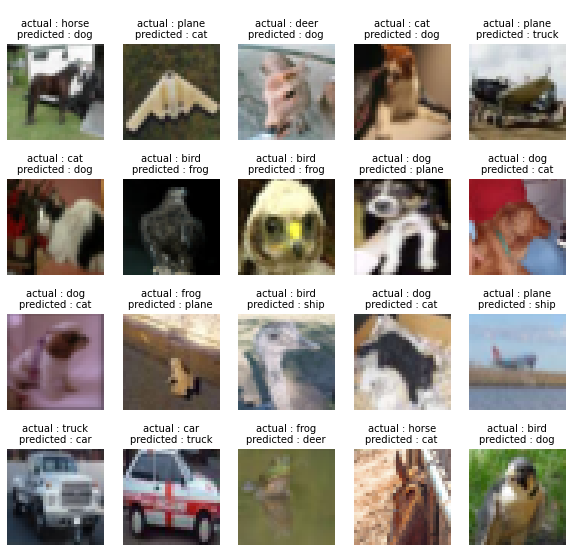

In [11]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

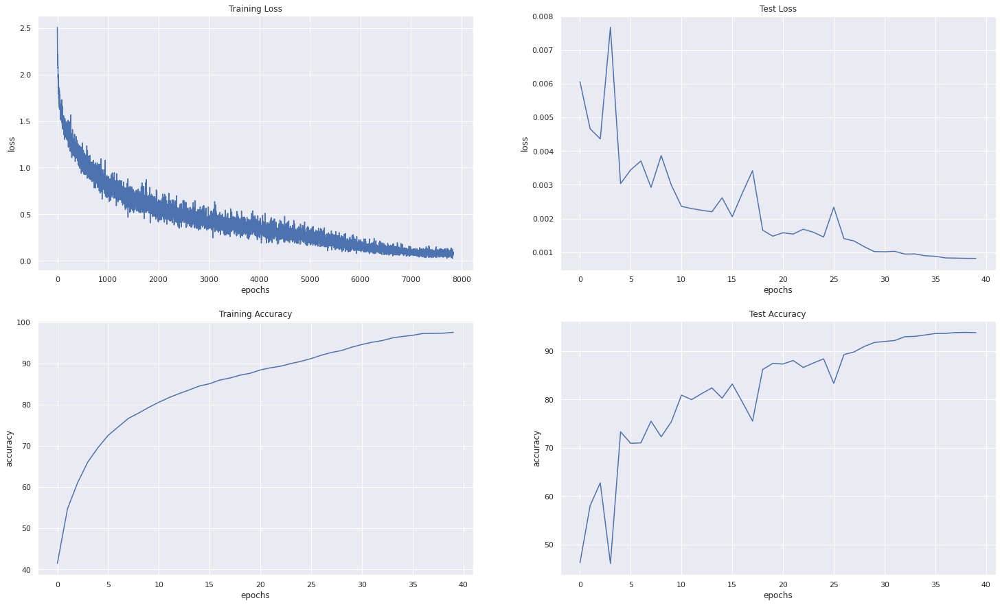

In [12]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [13]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 95 %
Accuracy of   car : 97 %
Accuracy of  bird : 90 %
Accuracy of   cat : 87 %
Accuracy of  deer : 94 %
Accuracy of   dog : 88 %
Accuracy of  frog : 96 %
Accuracy of horse : 95 %
Accuracy of  ship : 96 %
Accuracy of truck : 95 %


## Plot Confusion Matrix

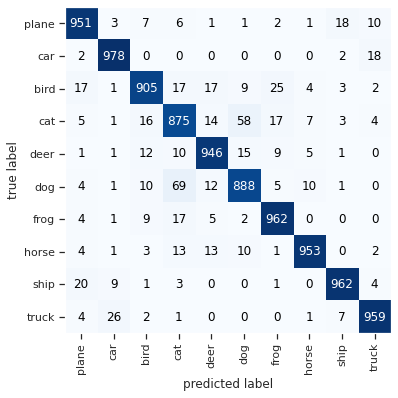

In [14]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


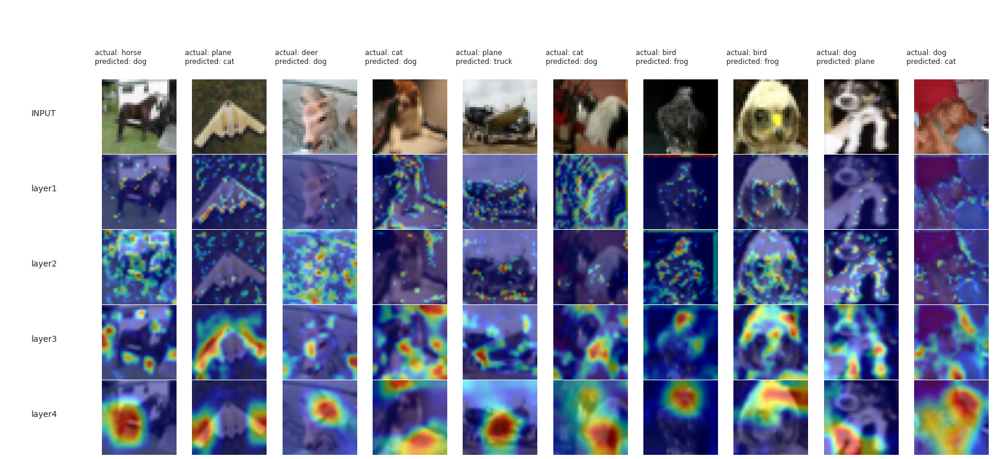

In [15]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


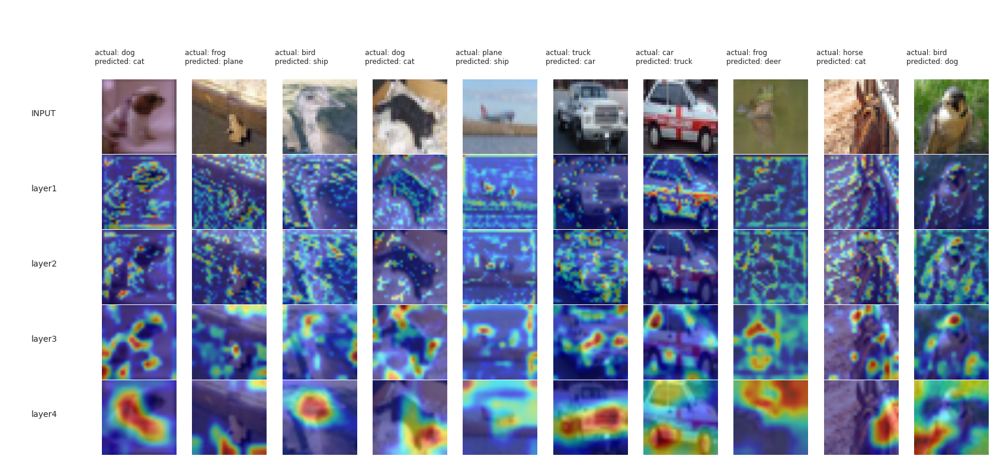

In [16]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [17]:

%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>